# Getting Started with Sentinel-2

This notebook is a very simple example of the fundamentals of working with
Earth observation data using the Open Data Cube.

## Import libraries

In [1]:
from datacube import Datacube
from odc.geo.geom import point

## Configure the environment

In [2]:
dc = Datacube()

## Pick a study area

In [3]:
# Find a location you're interested in on Google Maps and copy the coordinates
# by right-clicking on the map and clicking the coordinates

# These coords are in the order Y then X, or Latitude then Longitude
coords = -8.6252, 115.2048  # Denpasar, Bali
aoi_point = point(coords[1], coords[0], crs="EPSG:4326")
bbox = aoi_point.buffer(0.1).boundingbox

landsat_stretch = dict(vmin=1000, vmax=4000)

datetime = "2025-03-01/2025-03-14"

# Preview the area
bbox.explore(zoom=8)

## Load data

This uses the Datacube library to handle loading of the actual data. The `dask_chunks` argument instructs the tool to use Dask
to lazy-load the data.

In [4]:
data = dc.load(
    product="s2_l2a",
    measurements=["red", "green", "blue"],
    output_crs="EPSG:32750",
    resolution=10,
    time=("2025-03-01", "2025-03-14"),
    x=(float(bbox.left), float(bbox.right)),
    y=(float(bbox.bottom), float(bbox.top)),
    dask_chunks={},
    group_by="solar_day",
)

data

Querying product Product(name='s2_l2a', id_=9)


<xarray.Dataset> Size: 177MB
Dimensions:      (time: 6, y: 2224, x: 2213)
Coordinates:
  * time         (time) datetime64[ns] 48B 2025-03-02T02:40:37.503000 ... 202...
  * y            (y) float64 18kB 9.057e+06 9.057e+06 ... 9.035e+06 9.035e+06
  * x            (x) float64 18kB 2.914e+05 2.914e+05 ... 3.135e+05 3.135e+05
    spatial_ref  int32 4B 32750
Data variables:
    red          (time, y, x) uint16 59MB dask.array<chunksize=(1, 2224, 2213), meta=np.ndarray>
    green        (time, y, x) uint16 59MB dask.array<chunksize=(1, 2224, 2213), meta=np.ndarray>
    blue         (time, y, x) uint16 59MB dask.array<chunksize=(1, 2224, 2213), meta=np.ndarray>
Attributes:
    crs:           EPSG:32750
    grid_mapping:  spatial_ref

In [5]:
import datacube
import dask
import distributed

print("Datacube version:", datacube.__version__)
print("Dask version:", dask.__version__)
print("Dask distributed version:", distributed.__version__)

Datacube version: 1.9.6
Dask version: 2025.5.1
Dask distributed version: 2025.5.1


## Visualise data

This step uses `matplotlib` to view data as a static image. It takes a longer time to
run than previous steps, because it's actually loading the data to prepare the images.

The `to_array()` function is a trick used to be able to visualise the data as a
red, green, blue "true colour" image.

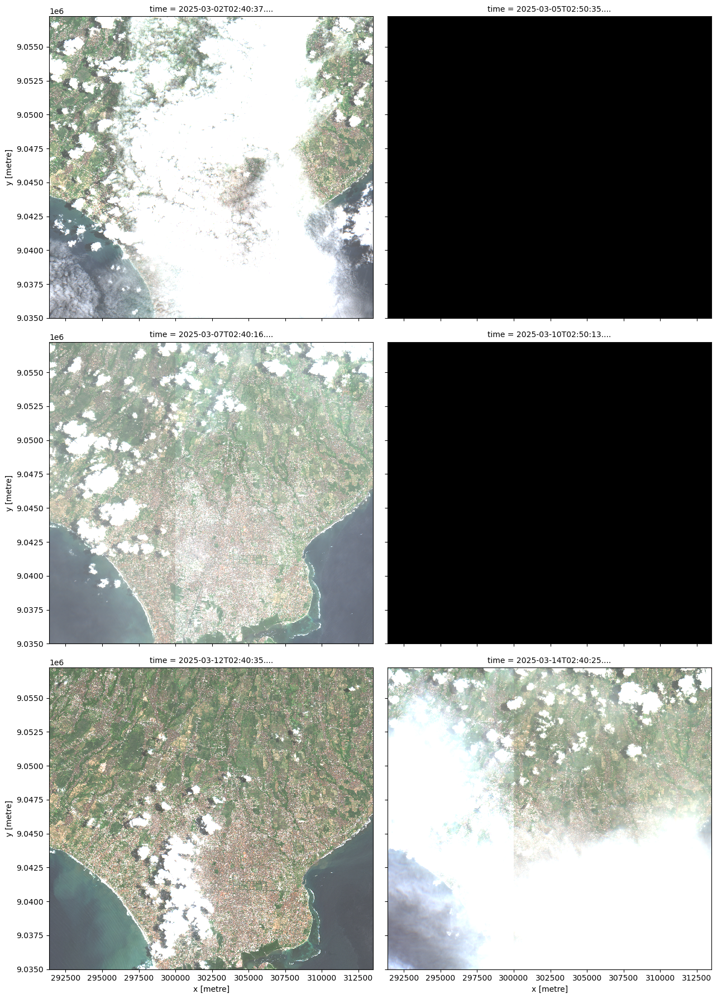

/srv/conda/envs/notebook/lib/python3.12/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


In [6]:
data.to_array().plot.imshow(col="time", col_wrap=2, size=6, vmin=0, vmax=3000)

### Interactive map

This step uses another `odc` tool to visualise the data on a map.

In [7]:
best = data.sel(time="2025-03-12").squeeze()
visualisation = best.odc.to_rgba(vmin=0, vmax=3000)

visualisation.odc.explore()

## Export data

Here we write data to disk, again using an `odc` tool.

In [8]:
visualisation.odc.write_cog("sentinel2_example.tif", overwrite=True)

PosixPath('sentinel2_example.tif')